In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from tqdm import tqdm

%matplotlib inline

In [ ]:
!gdown 1Bv0wc0qBnqIRBr4O2_uU24yAZMxIca7_
!gdown 1u8zL9B7S-H7slJYmkGIKIFJyI-tbIzoo

Downloading...
From (original): https://drive.google.com/uc?id=1Bv0wc0qBnqIRBr4O2_uU24yAZMxIca7_
From (redirected): https://drive.google.com/uc?id=1Bv0wc0qBnqIRBr4O2_uU24yAZMxIca7_&confirm=t&uuid=f94e467f-31f9-4681-8b42-fca3369e265f
To: /content/flowers.zip
100% 236M/236M [00:01<00:00, 142MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1u8zL9B7S-H7slJYmkGIKIFJyI-tbIzoo
From (redirected): https://drive.google.com/uc?id=1u8zL9B7S-H7slJYmkGIKIFJyI-tbIzoo&confirm=t&uuid=b478fc05-1a2a-42e5-8e4d-ef17e458b6c9
To: /content/cv_obj_detection.zip
100% 53.2M/53.2M [00:00<00:00, 75.6MB/s]


In [ ]:
!unzip -q 'cv_obj_detection.zip' -d "data1"
!unzip -q 'flowers.zip' -d "data2"

replace data1/CV Object Detecton Dataset/00-puppy.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: replace data2/flowers/daisy/100080576_f52e8ee070_n.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
X=[]
Z=[]
IMG_SIZE=150
FLOWER_SUNFLOWER_DIR='/content/data2/flowers/sunflower'
def assign_label(img,flower_type):
    return flower_type

In [ ]:
#FUNCTION TO LOAD DATA
def make_train_data(flower_type,DIR):
    for img in tqdm(os.listdir(DIR)): # It returns a list of strings where each string is a filename or directory name present in the specified directory.
        label=assign_label(img,flower_type)
        path = os.path.join(DIR,img) # It returns a string which represents the path formed by joining DIR and img
        img = cv2.imread(path,cv2.IMREAD_COLOR) # Taking the picture
        img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))#Resizing the image

        X.append(np.array(img))#we are storing the data in the form of a list
        Z.append(str(label))# we are also storing the label in the form of a list

In [ ]:
#Loading Sunflower Data
make_train_data('Sunflower',FLOWER_SUNFLOWER_DIR)
print(len(X))

100%|██████████| 733/733 [00:04<00:00, 161.04it/s]

733


In [ ]:
fix_img = cv2.cvtColor(X[0],cv2.COLOR_BGR2RGB)

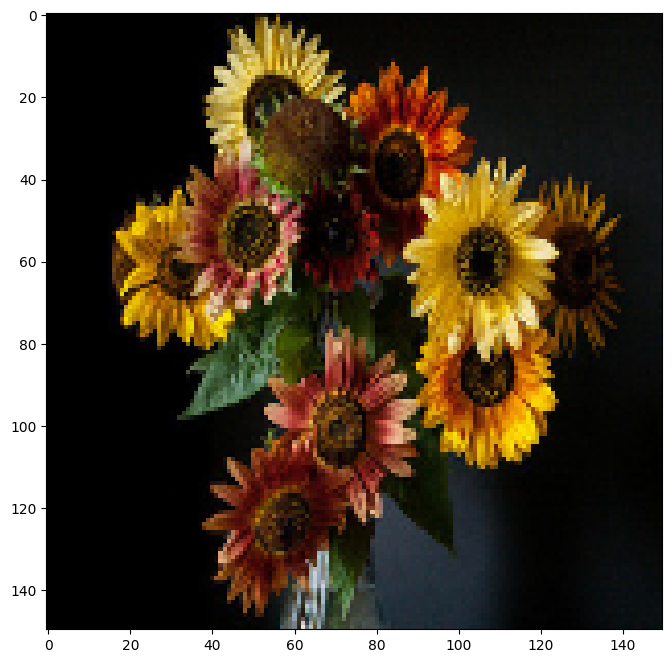

In [ ]:
plt.figure(figsize=(12,8))
plt.imshow(fix_img)

In [ ]:
new_img_1 = fix_img.copy()
new_img_1.shape

(150, 150, 3)

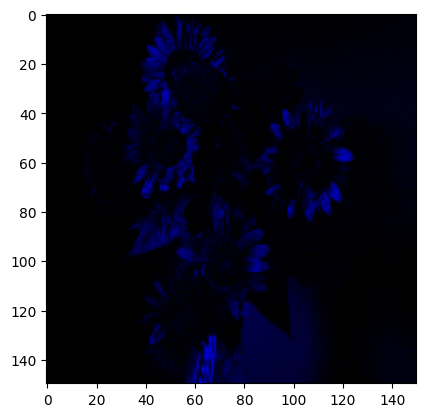

In [ ]:
new_img_1[:,:,0] = 0 # making R channel zero
new_img_1[:,:,1] = 0 #making G channel zero
plt.imshow(new_img_1)

In [ ]:
new_img_2 = fix_img.copy()
new_img_3 = fix_img.copy()

#For Red color Channel
new_img_2[:,:,1] = 0
new_img_2[:,:,2] = 0
#For Green color channel
new_img_3[:,:,0] = 0
new_img_3[:,:,2] = 0

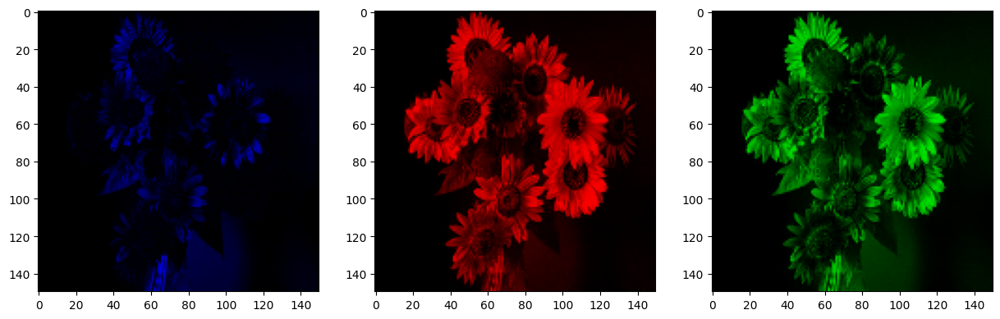

In [ ]:
f, axes = plt.subplots(1,3,figsize=(15,15))
list=[new_img_1,new_img_2,new_img_3]
i=0

for ax in axes:
  ax.imshow(list[i])
  i+=1

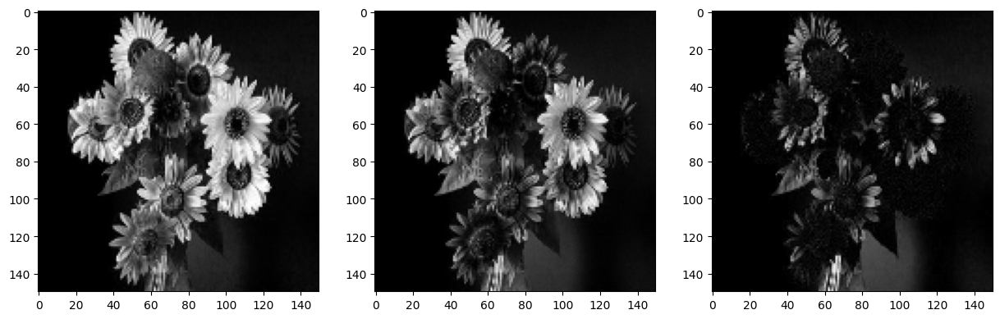

In [ ]:
f, axes = plt.subplots(1,3, figsize = (15,15))
list = [fix_img[:,:,0],fix_img[:,:,1],fix_img[:,:,2]]
i = 0
for ax in axes:
    ax.imshow(list[i],cmap = 'gray')
    i+=1

#### Parte dois :

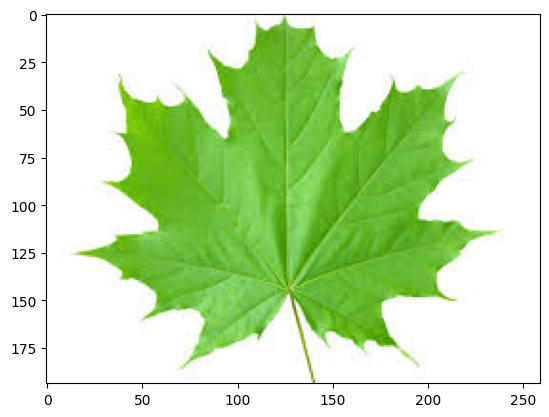

In [ ]:
pic = cv2.imread('/content/data1/CV Object Detecton Dataset/leaf.jfif')
pic = cv2.cvtColor(pic,cv2.COLOR_BGR2RGB)
plt.imshow(pic)

In [ ]:
type(pic), pic.shape

(numpy.ndarray, (194, 259, 3))

In [ ]:
matrix = np.float32([[1,0,20],[0,1,30]])

In [ ]:
rows,cols,chn = pic.shape
print('height:{}'.format(rows))
print('width:{}'.format(cols))
print("pic shape: {} ".format(pic.shape))

height:194
width:259
pic shape: (194, 259, 3) 


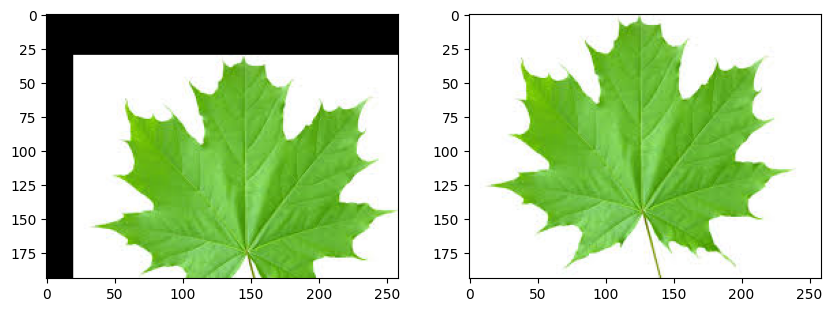

In [ ]:
translated_pic = cv2.warpAffine(pic,matrix,(cols,rows)) # Translating the picture.

plt.figure(figsize=(10,8))
plt.subplot(121)
plt.imshow(translated_pic)

# plt.figure(figsize=(10,8))
plt.subplot(122)
plt.imshow(pic)
plt.show()

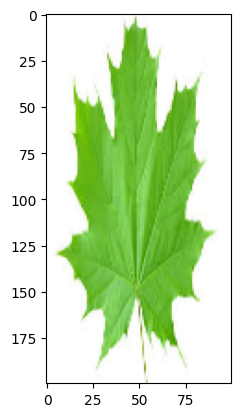

In [ ]:
resized_pic = cv2.resize(pic,(100,200))
plt.imshow(resized_pic)

In [ ]:
resized_pic.shape

(200, 100, 3)

shape:(97, 130, 3)


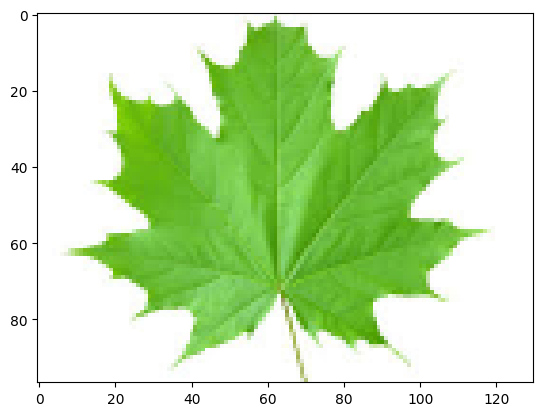

In [ ]:
width_ratio = 0.5
height_ratio = 0.5
resized_pic2 = cv2.resize(pic,(0,0),pic,width_ratio,height_ratio)
plt.imshow(resized_pic2)
print('shape:{}'.format(resized_pic2.shape))# shape reduced by 50%

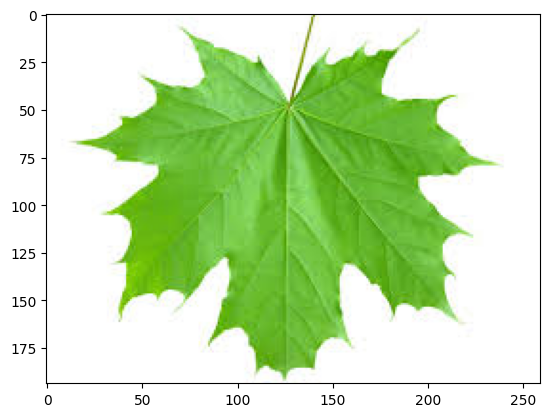

In [ ]:
rotate = cv2.flip(pic,0)#you also can pass value like--> 0,1,-1 etc.
plt.imshow(rotate)# Rotated by 180 degree

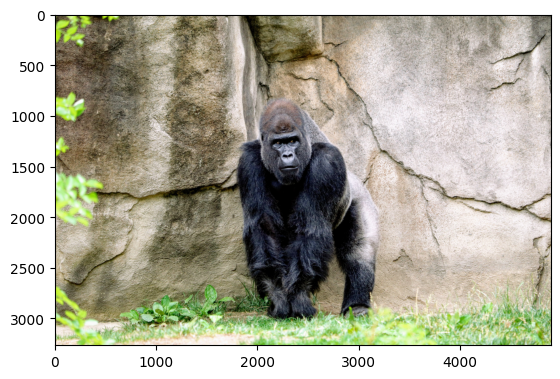

In [ ]:
pic1 = cv2.imread('/content/data1/CV Object Detecton Dataset/gorilla.jpg')
pic1 = cv2.cvtColor(pic1,cv2.COLOR_BGR2RGB)
plt.imshow(pic1)

In [ ]:
pic1.shape

(3265, 4898, 3)

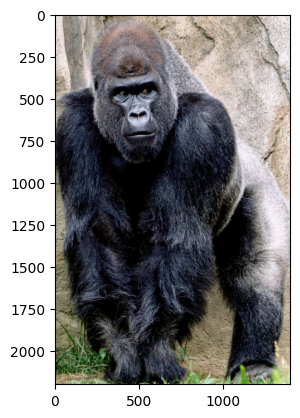

In [ ]:
crop = pic1[800:3000,1800:3200]
plt.imshow(crop)

#### Last Part :

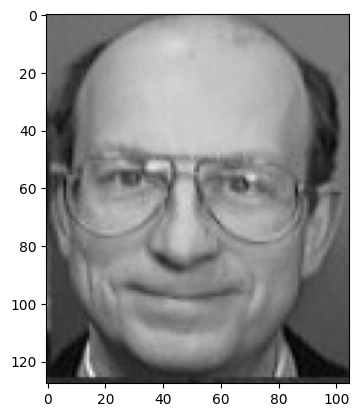

In [ ]:
img = cv2.imread('/content/data1/CV Object Detecton Dataset/SharedScreenshot1.jpg',0)
plt.imshow(img,cmap = 'gray')

In [ ]:
img.max()/2#Finding middle value of the distribution of the pixel value

122.5

In [ ]:
'''1st arg as the gray image itself the 2nd arg as the threshold value(usually the mean value of pixel values) then 3rd
arg as the the max pixel value and as the last arg we pass the method using which we are going to do the thresholding'''
ret3,thresh3 = cv2.threshold(img,123,255,cv2.THRESH_TRUNC)

In [ ]:
ret, thresh1 = cv2.threshold(img,123,255,cv2.THRESH_BINARY)

In [ ]:
ret, thresh2 = cv2.threshold(img,123,255,cv2.THRESH_TRIANGLE)

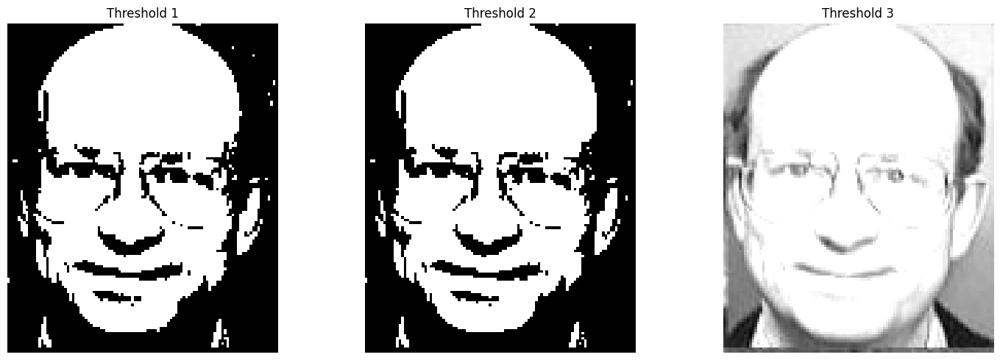

In [ ]:
plt.figure(figsize=(15, 5))  # Adjust figsize as per your preference

plt.subplot(131)  # Subplot 1 in a 1x3 grid
plt.imshow(thresh1, cmap='gray')
plt.title('Threshold 1')
plt.axis('off')  # Optionally turn off axis if needed

plt.subplot(132)  # Subplot 2 in a 1x3 grid
plt.imshow(thresh2, cmap='gray')
plt.title('Threshold 2')
plt.axis('off')

plt.subplot(133)  # Subplot 3 in a 1x3 grid
plt.imshow(thresh3, cmap='gray')
plt.title('Threshold 3')
plt.axis('off')

plt.tight_layout()  # Ensures subplots do not overlap
plt.show()

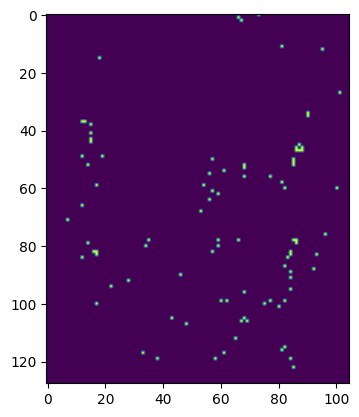

In [ ]:
diff = thresh1 - thresh2
plt.imshow(diff)

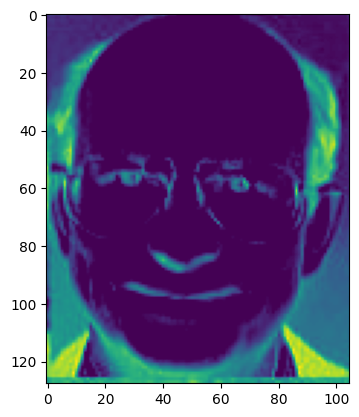

In [ ]:
diff1 = thresh1 - thresh3
plt.imshow(diff1)

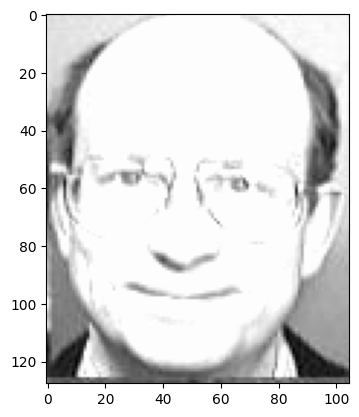

In [ ]:
sum1 = thresh1 + thresh3
plt.imshow(sum1,cmap = 'gray')

In [ ]:
'''1st arg: Gray image itself
   2nd arg:Max pixel value
   3rd arg: Type for calculating mean
   4th arg:thresholding type
   5th arg: block size(size of the pixel neighbourhood for calculate a threshold, it is needed to be odd like-3,5,7 etc.)
   6th arg: c constant(Generally a constant value & a odd number)'''
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8)

In [ ]:
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,8)

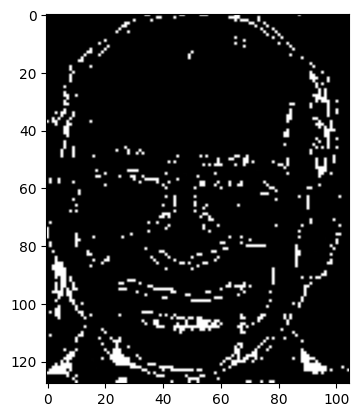

In [ ]:
th = th3 - th2
th.shape
plt.imshow(th,cmap = 'gray')


#### Bluring and Smoothing :

In [ ]:
#Function for Loading the image
def load_img():
    img = cv2.imread('/content/data1/CV Object Detecton Dataset/blue_brick.jpg')
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

In [ ]:
#Function for displaying the image
def disp_img(img,cmap = None):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)

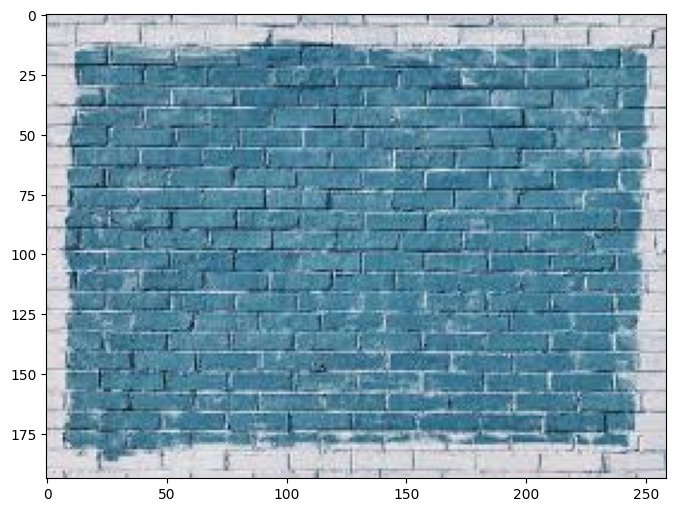

In [ ]:
img1 = load_img()
disp_img(img1)

In [ ]:
img1.shape

(194, 259, 3)

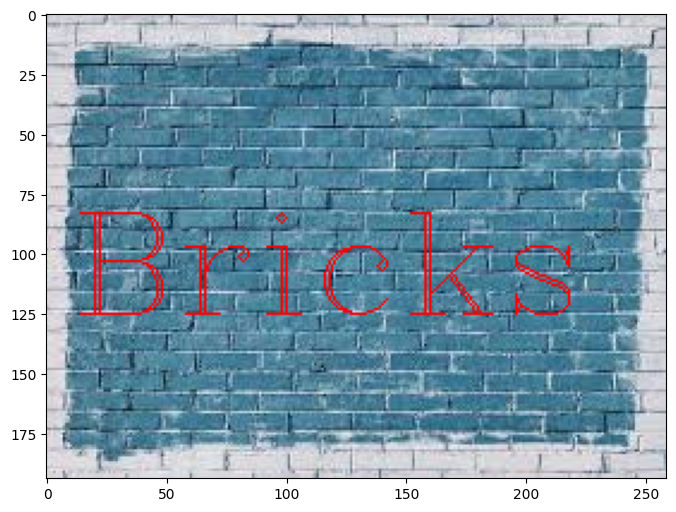

In [ ]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
disp_img(img2)

In [ ]:
#Creating a custom kernel as a filter for our bluring perpous
import numpy as np
kernel = np.ones(shape=(3,3),dtype = np.float32)/6.07 ### WE ARE DIVIDING THAT BY 25(KERNEL SIZE= 5X5)
#TO GET FLOTING VALUES IF WE USE THAT FOR MULTIPLYING THE OTHER IMAGE THEN PIXEL VALUE WILL BE DECREASED OF OTHER IMAGE

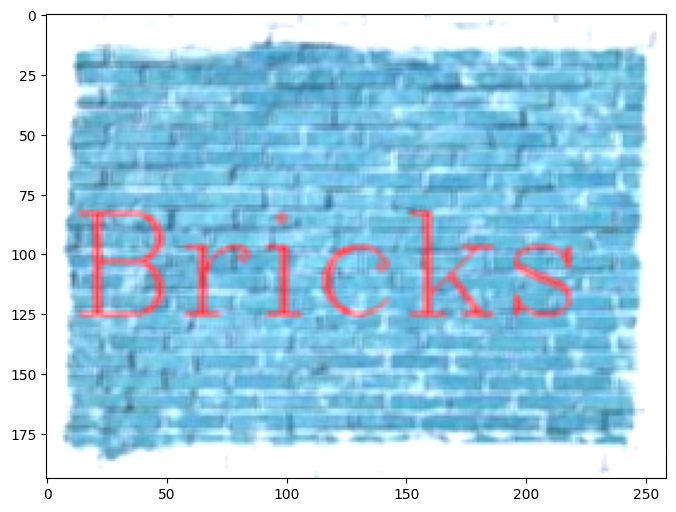

In [ ]:
dst = cv2.filter2D(img2,-1,kernel)
disp_img(dst)

In [ ]:
#Loading image again
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')

reset


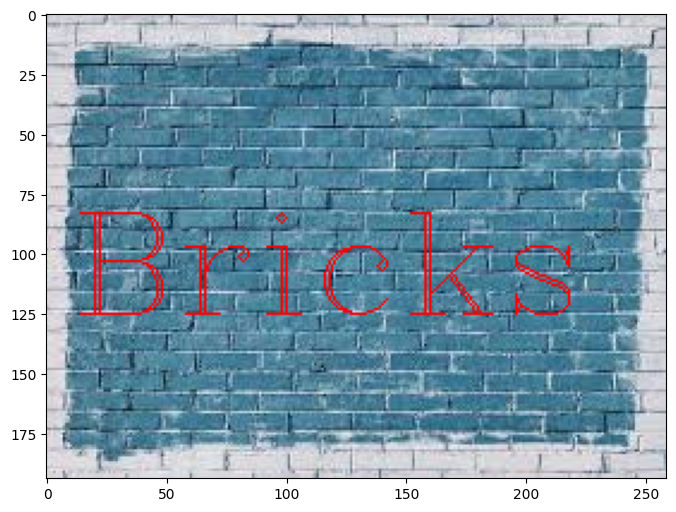

In [ ]:
disp_img(img2)


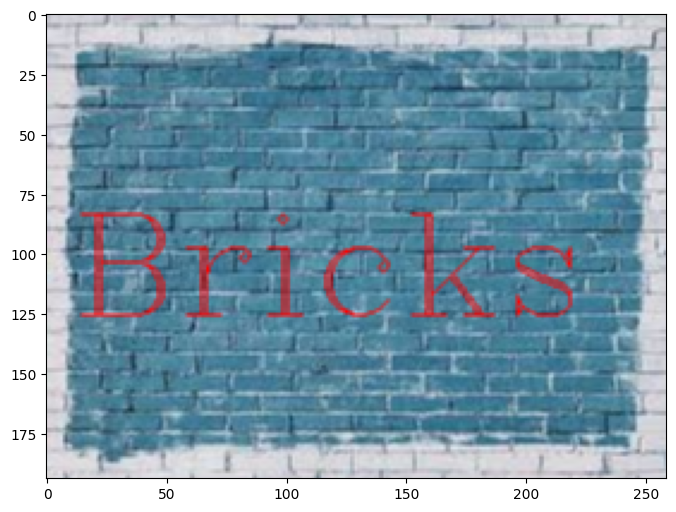

In [ ]:
blur = cv2.blur(img2,ksize = (2,2))
disp_img(blur)

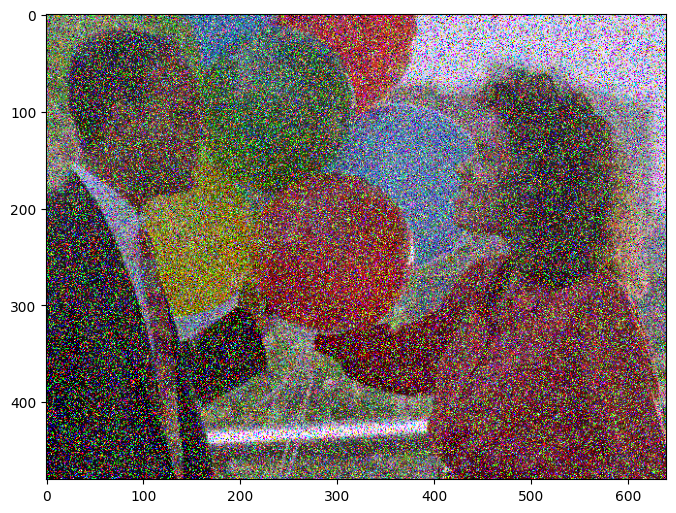

In [ ]:
noisy_img2  = cv2.imread('/content/data1/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img2 = cv2.cvtColor(noisy_img2,cv2.COLOR_BGR2RGB)
disp_img(noisy_img2)

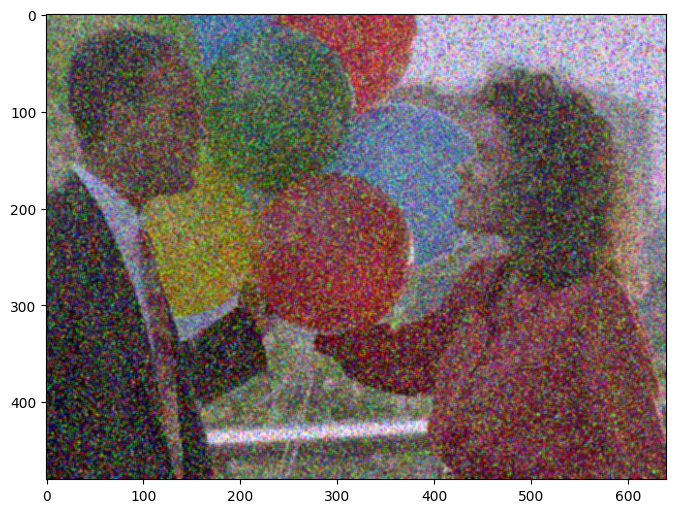

In [ ]:
blur = cv2.blur(noisy_img2,ksize = (3,3))
disp_img(blur)

reset


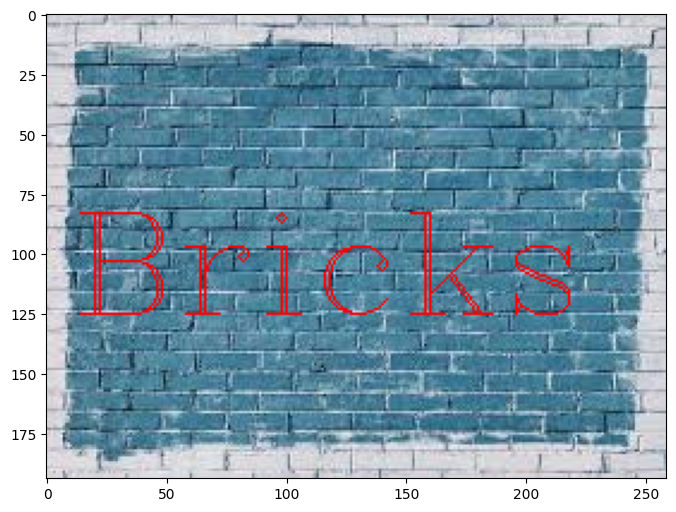

In [ ]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')
disp_img(img2)

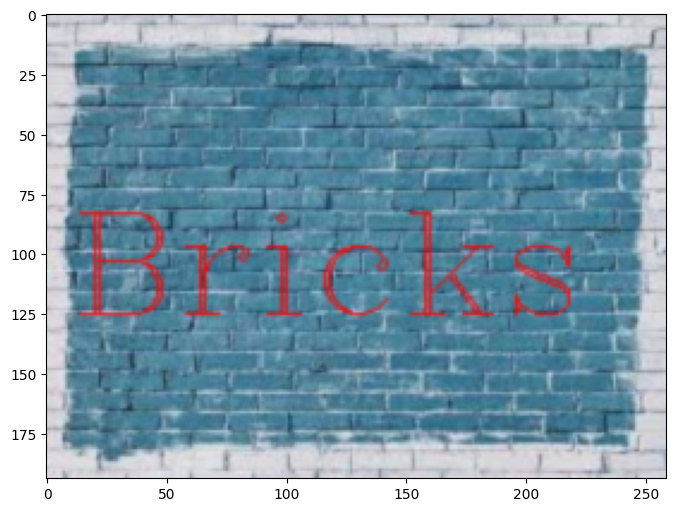

In [ ]:
blur_img  = cv2.GaussianBlur(img2,(3,3),0.64)
disp_img(blur_img)

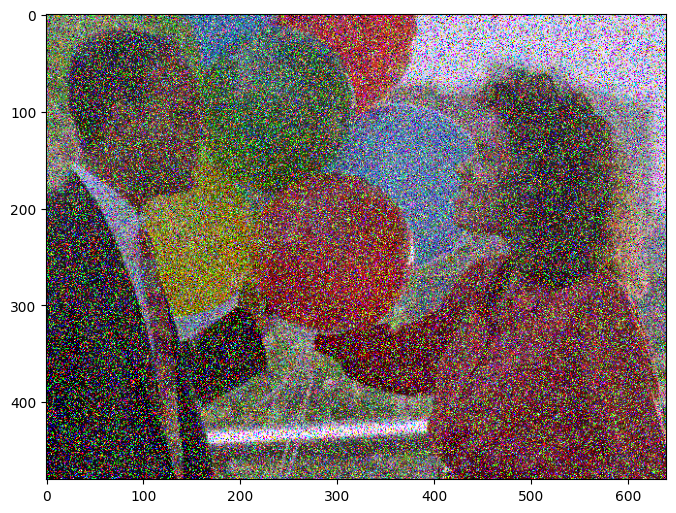

In [ ]:
noisy_img1  = cv2.imread('/content/data1/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img1 = cv2.cvtColor(noisy_img1,cv2.COLOR_BGR2RGB)
disp_img(noisy_img1)

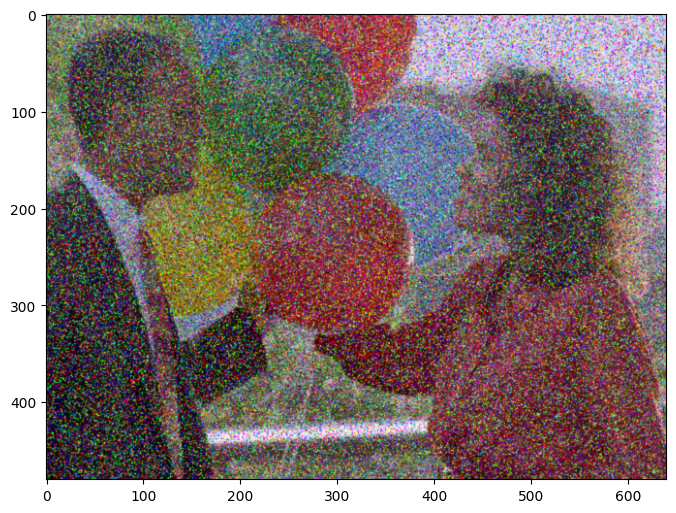

In [ ]:
blur_img  = cv2.GaussianBlur(noisy_img1,(3,3),0.64)
disp_img(blur_img)

reset


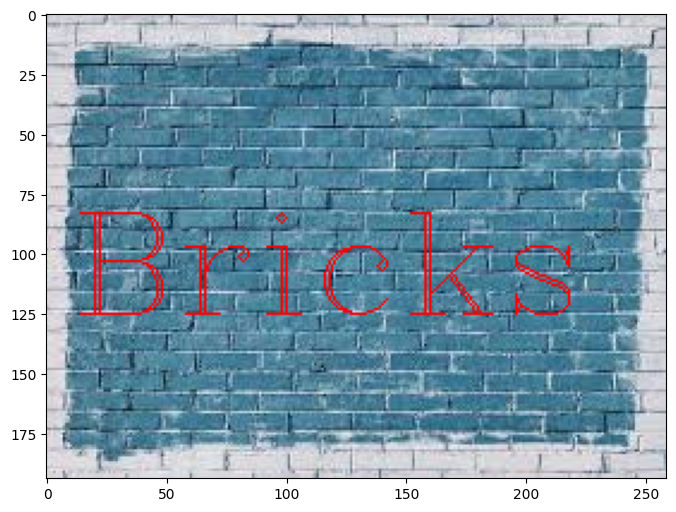

In [ ]:
img2 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2,text = 'Bricks',org = (10,125),fontFace = font,fontScale = 2,color = (255,0,0),thickness = 1)
print('reset')
disp_img(img2)

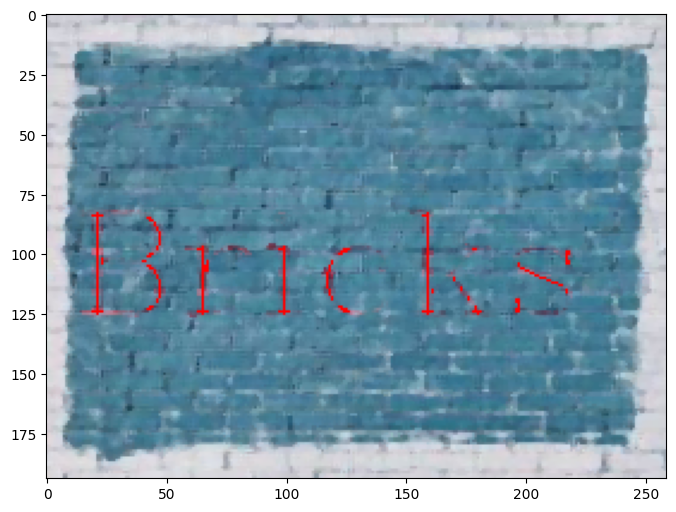

In [ ]:
median_blur = cv2.medianBlur(img2,3)
disp_img(median_blur)

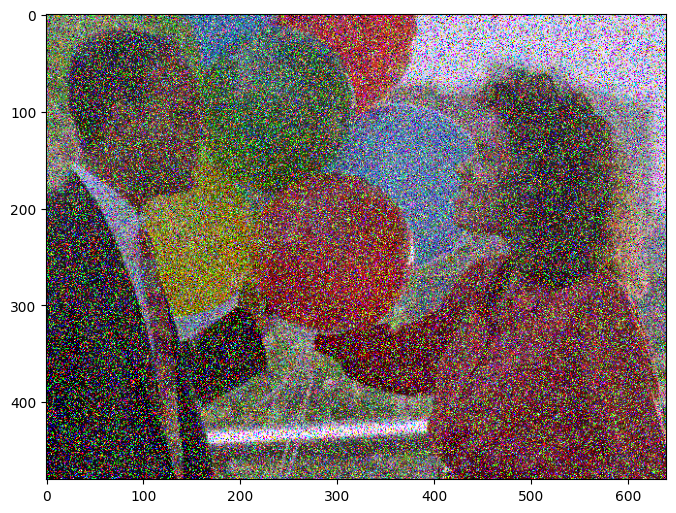

In [ ]:
noisy_img  = cv2.imread('/content/data1/CV Object Detecton Dataset/balloons_noisy.png')
noisy_img = cv2.cvtColor(noisy_img,cv2.COLOR_BGR2RGB)
disp_img(noisy_img)

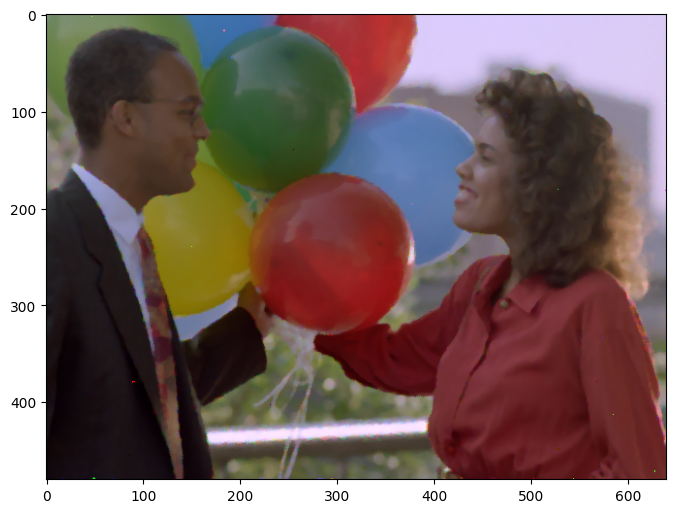

In [ ]:
median = cv2.medianBlur(noisy_img,5)
disp_img(median)

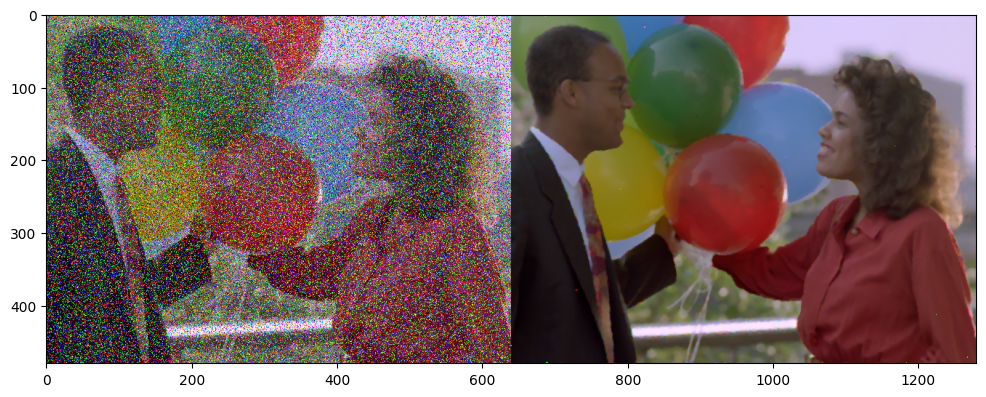

In [ ]:
plt.figure(figsize=(12,10))
attatiched = np.concatenate([noisy_img,median],axis=1)
plt.imshow(attatiched)

In [ ]:
#READING THREE DIFFERENT IMAGES
dark =cv2.imread('/content/data1/CV Object Detecton Dataset/dark_image.jpg')
dark_img = cv2.cvtColor(dark,cv2.COLOR_BGR2RGB)

rainbo =cv2.imread('/content/data1/CV Object Detecton Dataset/rainbo.jpg')
rainbo_img = cv2.cvtColor(rainbo,cv2.COLOR_BGR2RGB)

brick =cv2.imread('/content/data1/CV Object Detecton Dataset/blue_brick.jpg')
brick_img = cv2.cvtColor(brick,cv2.COLOR_BGR2RGB)

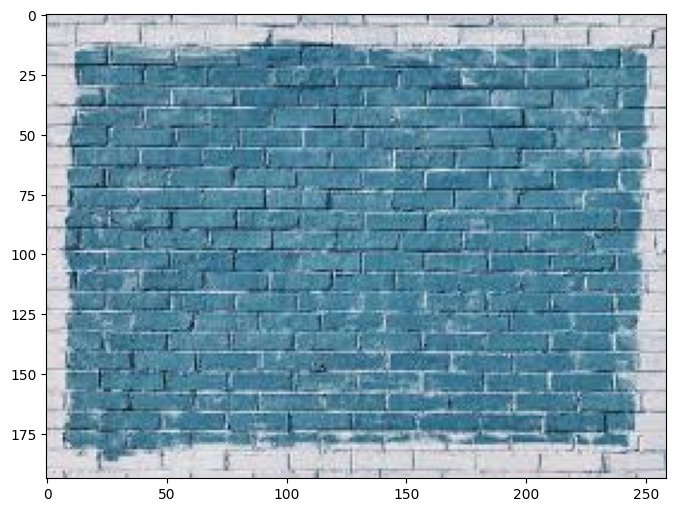

In [ ]:
disp_img(brick_img)

In [ ]:
rainbo_hist = cv2.calcHist([rainbo],channels = [0],mask = None,histSize= [256],ranges = [0,256])

In [ ]:
rainbo_hist.shape


(256, 1)

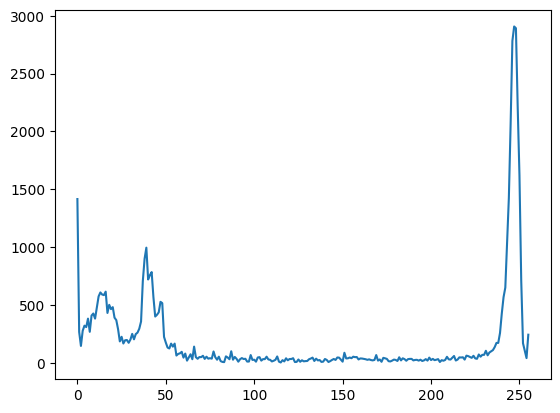

In [ ]:
plt.plot(rainbo_hist)
#plt.xlim([0,20])

Text(0.5, 1.0, 'hist for rainbo')

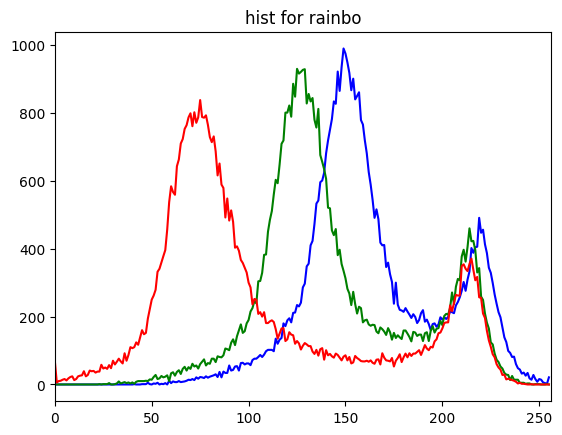

In [ ]:
color = ('b','g','r')

for i,col in enumerate(color):
    hist = cv2.calcHist([brick],[i],None,[256],[0,256])
    plt.plot(hist,color = col)
    plt.xlim([0,256])
    #plt.ylim()
plt.title('hist for rainbo')

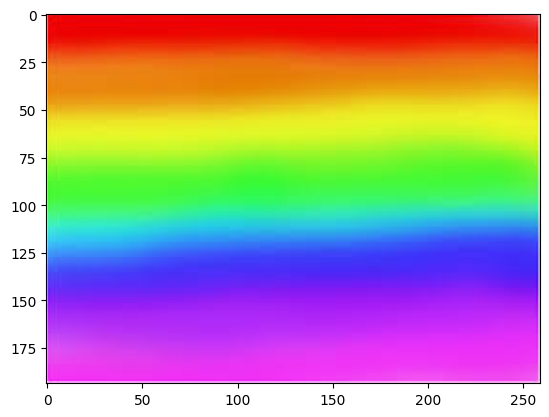

In [ ]:
rainbo =cv2.imread('/content/data1/CV Object Detecton Dataset/rainbo.jpg')
rainbo_img = cv2.cvtColor(rainbo,cv2.COLOR_BGR2RGB)
plt.imshow(rainbo_img)

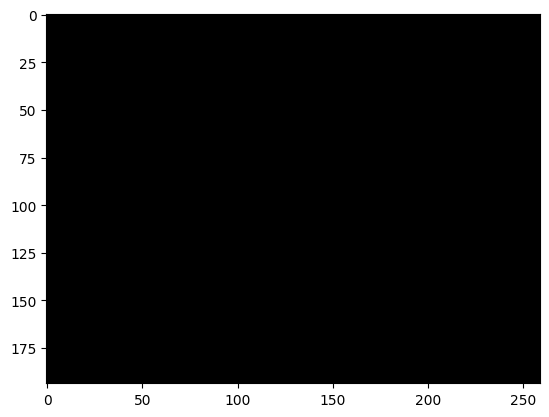

In [ ]:
mask = np.zeros(rainbo_img.shape[:2],np.uint8)
plt.imshow(mask,cmap = 'gray')

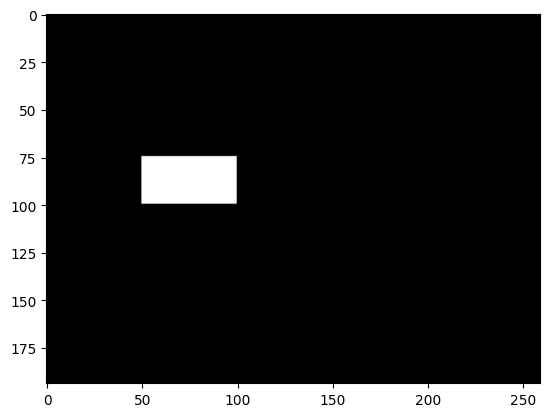

In [ ]:
mask[75:100,50:100] = 255
plt.imshow(mask,cmap = 'gray')

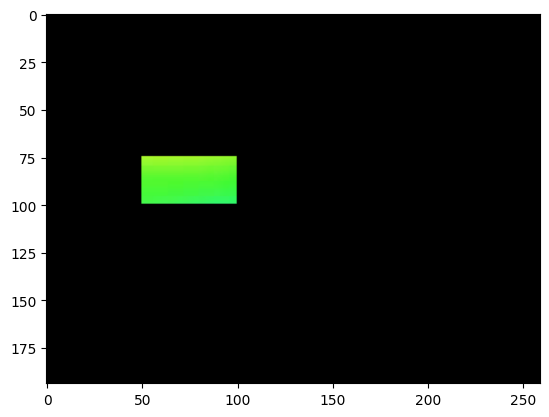

In [ ]:
masked_img = cv2.bitwise_and(rainbo,rainbo,mask = mask)
show_masked_img = cv2.bitwise_and(rainbo_img,rainbo_img,mask = mask)
plt.imshow(show_masked_img)

#### Line detection :

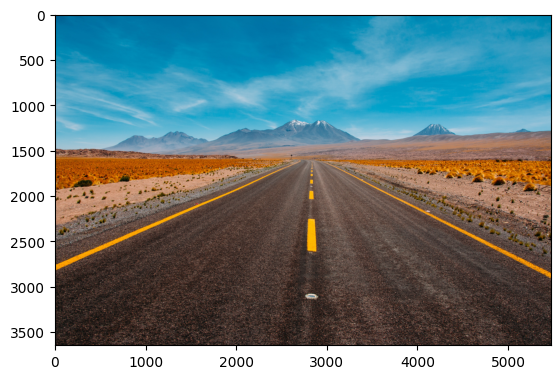

In [ ]:
road = cv2.imread('/content/data1/CV Object Detecton Dataset/yello_road.jpg')
road = cv2.cvtColor(road,cv2.COLOR_BGR2RGB)
plt.imshow(road)

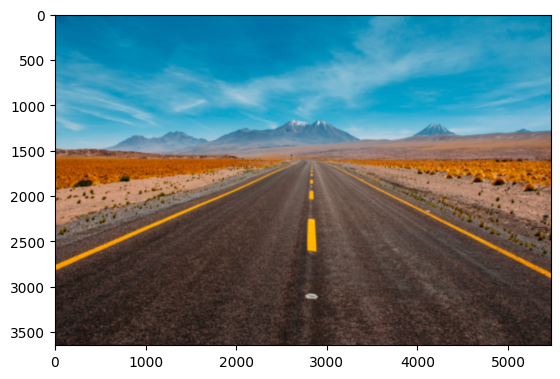

In [ ]:
blurry = cv2.GaussianBlur(road,(35,35),0)
blur_img = blurry.copy()
plt.imshow(blurry)

In [ ]:
import numpy as np
blur_img4 = blurry.copy()

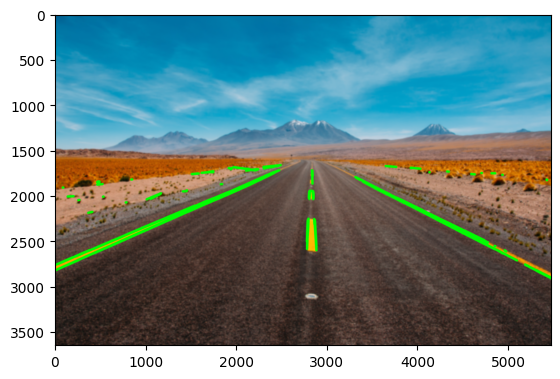

In [ ]:
hsv = cv2.cvtColor(blur_img4,cv2.COLOR_RGB2HSV)
low_yellow = np.array([18,94,140])
up_yellow = np.array([48,230,230])
mask = cv2.inRange(hsv,low_yellow,up_yellow)
edge = cv2.Canny(mask,75,150)

line = cv2.HoughLinesP(edge,1,np.pi/180,50,maxLineGap = 50)

for i in line:
    x1,y1,x2,y2 = i[0]
    cv2.line(blur_img4,(x1,y1),(x2,y2),(0,255,0),25)

plt.imshow(blur_img4)